In [32]:
import os
import numpy as np

from sentinelsat import SentinelAPI, read_geojson, geojson_to_wkt 
import geopandas as gpd
import matplotlib.pyplot as plt

from shapely.geometry import MultiPolygon, Polygon
import rasterio as rio
from rasterio.plot import show
import rasterio.mask
import fiona
import folium
from osgeo import gdal

from geojson import Polygon
import json

In [17]:
path = './'
work_path = './work'

RGB_dir = './work/RGB_TIF'
NDVI_dir = './work/NDVI'
NDVI_mask_dir = './work/NDVI_mask'

# データ読み込み

## 衛星データ読み込み

In [15]:
product_titles = \
['S2B_MSIL1C_20220106T020049_N0301_R060_T52SEB_20220106T033525',
 'S2B_MSIL1C_20220106T020049_N0301_R060_T52SFB_20220106T033525',
 'S2A_MSIL1C_20211222T020111_N0301_R060_T52SFB_20211222T034633',
 'S2A_MSIL1C_20211202T020041_N0301_R060_T52SFB_20211202T032954',
 'S2A_MSIL1C_20220101T020101_N0301_R060_T52SEB_20220101T034550',
 'S2B_MSIL1C_20211207T020049_N0301_R060_T52SFB_20211207T033709',
 'S2A_MSIL1C_20211212T020101_N0301_R060_T52SEB_20211212T034414',
 'S2B_MSIL1C_20211227T020059_N0301_R060_T52SFB_20211227T034403',
 'S2A_MSIL1C_20220101T020101_N0301_R060_T52SFB_20220101T034550',
 'S2B_MSIL1C_20211207T020049_N0301_R060_T52SEB_20211207T033709',
 'S2A_MSIL1C_20211222T020111_N0301_R060_T52SEB_20211222T034633',
 'S2A_MSIL1C_20211212T020101_N0301_R060_T52SFB_20211212T034414']

TIFファイルを読み込み、メタデータを取得するとともに、ついでにRGB合成した画像を出力

In [18]:
%%time
for file_title in product_titles:
    # カラー合成
    # RGBが各画像を読み込み１つのファイルへの書き出し
    print("Start make RGB TIF image " +'<'+ file_title +'>')

    path_A = str(file_title) + '.SAFE/GRANULE/'
    f1 = os.listdir(path_A)
    path_B = str(file_title) + '.SAFE/GRANULE/' + str(f1[0])
    f2 = os.listdir(path_B)
    path_C = str(file_title) + '.SAFE/GRANULE/' + str(f1[0]) + '/IMG_DATA/'
    f3 = os.listdir(path_C)

    b2 = rio.open(str(file_title) + '.SAFE/GRANULE/' + str(f1[0]) +'/IMG_DATA/' +str(f3[0][0:23] +'B02.jp2'))
    b3 = rio.open(str(file_title) + '.SAFE/GRANULE/' + str(f1[0]) +'/IMG_DATA/' +str(f3[0][0:23] +'B03.jp2'))
    b4 = rio.open(str(file_title) + '.SAFE/GRANULE/' + str(f1[0]) +'/IMG_DATA/' +str(f3[0][0:23] +'B04.jp2'))

    RGB_path = os.path.join(RGB_dir,'sentinel-2_'+file_title+'_RGB.tif')

    RGB_colar = rio.open(RGB_path,'w',driver='Gtiff',
                       width=b4.width, height=b4.height,
                       count=3,
                       crs=b4.crs,
                       transform=b4.transform,
                       dtype=rasterio.uint16
                       )
    RGB_colar.write(b2.read(1),3) 
    RGB_colar.write(b3.read(1),2) 
    RGB_colar.write(b4.read(1),1) 
    RGB_colar.close()

epsg = b4.crs

Start make RGB TIF image <S2B_MSIL1C_20220106T020049_N0301_R060_T52SEB_20220106T033525>
Start make RGB TIF image <S2B_MSIL1C_20220106T020049_N0301_R060_T52SFB_20220106T033525>
Start make RGB TIF image <S2A_MSIL1C_20211222T020111_N0301_R060_T52SFB_20211222T034633>
Start make RGB TIF image <S2A_MSIL1C_20211202T020041_N0301_R060_T52SFB_20211202T032954>
Start make RGB TIF image <S2A_MSIL1C_20220101T020101_N0301_R060_T52SEB_20220101T034550>
Start make RGB TIF image <S2B_MSIL1C_20211207T020049_N0301_R060_T52SFB_20211207T033709>
Start make RGB TIF image <S2A_MSIL1C_20211212T020101_N0301_R060_T52SEB_20211212T034414>
Start make RGB TIF image <S2B_MSIL1C_20211227T020059_N0301_R060_T52SFB_20211227T034403>
Start make RGB TIF image <S2A_MSIL1C_20220101T020101_N0301_R060_T52SFB_20220101T034550>
Start make RGB TIF image <S2B_MSIL1C_20211207T020049_N0301_R060_T52SEB_20211207T033709>
Start make RGB TIF image <S2A_MSIL1C_20211222T020111_N0301_R060_T52SEB_20211222T034633>
Start make RGB TIF image <S2A_MS

In [19]:
# ピクセル数と座標系を表示
b4.count, b4.width, b4.height, b4.crs

(1, 10980, 10980, CRS.from_epsg(32652))

サイズが 1, 10980, 10980 であり、座標系が CRS.from_epsg(32652)であることがわかる

サイズの数字はピクセル数を表すため、これと解像度をかけることで対象データの範囲がわかる

→ Sentinel2は解像度10mなので、10980 * 10 ≒ 100km となる

## ポリゴンデータ取得

ポリゴンデータを　https://nlftp.mlit.go.jp/ksj/gml/datalist/KsjTmplt-N03-v2_3.html#prefecture42　からダウンロードし、本環境へ格納

In [20]:
# # ファイルを解凍する
# filename = './work/N03/N03-190101_42_GML.zip'
# import zipfile
# with zipfile.ZipFile(filename) as zf:
#     zf.extractall()

In [21]:
# !mv N03* ./work/N03/

In [22]:
shape_path = './work/N03/'
in_shape = gpd.read_file(os.path.join(shape_path + "N03-19_42_190101.shp"),encoding="shift-jis")

In [23]:
in_shape.N03_004.value_counts()

長崎市      2232
五島市      1674
壱岐市      1184
佐世保市      939
新上五島町     855
平戸市       589
対馬市       519
西海市       515
小値賀町      229
松浦市       199
南島原市       66
島原市        54
諫早市        53
時津町        18
大村市        16
雲仙市        11
川棚町        10
東彼杵町        8
長与町         4
波佐見町        1
佐々町         1
Name: N03_004, dtype: int64

In [24]:
shape_srt = in_shape[in_shape.N03_004.isin(['雲仙市','島原市','南島原市'])].drop(columns=["N03_002","N03_003"])

In [25]:
shape_srt[:3]

,N03_001,N03_004,N03_007,geometry
1703,長崎県,雲仙市,42213,"POLYGON ((130.14330 32.68242, 130.14328 32.682..."
1704,長崎県,雲仙市,42213,"POLYGON ((130.15404 32.68653, 130.15403 32.686..."
1705,長崎県,雲仙市,42213,"POLYGON ((130.15394 32.68698, 130.15395 32.686..."


In [26]:
shape_srt.shape

(131, 4)

In [27]:
str(epsg)

'EPSG:32652'

In [78]:
# ポリゴンの座標系をSentinel-2のデータと同じUTM zone 54N (EPSG:32652) に変換
shapefile = os.path.join(shape_path + "reshape_N03-19_42_190101.shp")
re_shape = shape_srt.to_crs({"init": str(epsg)})

#出力
re_shape.to_file(driver="ESRI Shapefile",filename=shapefile)

/usr/local/lib/python3.8/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/usr/local/lib/python3.8/dist-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


/usr/local/lib/python3.8/dist-packages/geopandas/plotting.py:637: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  warnings.warn(


<function matplotlib.pyplot.show(close=None, block=None)>

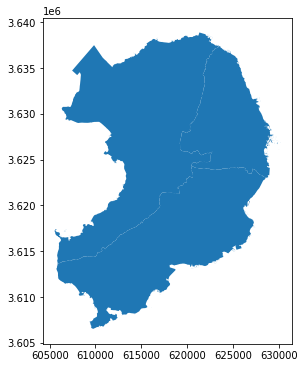

In [79]:
#GeoDataFrameを描画
f,ax = plt.subplots(1, figsize=(6,6))
ax = re_shape.plot(axes=ax)
plt.show

In [80]:
# マスクデータ生成
with fiona.open(shapefile, "r") as mask:
    masks = [feature["geometry"] for feature in mask]

In [81]:
masks[:1]

[{'type': 'Polygon',
  'coordinates': [[(607186.5183152044, 3616658.589000899),
    (607184.6925034726, 3616648.2396758585),
    (607089.4429451395, 3616680.354859399),
    (607091.9156938058, 3616690.4952493394),
    (607186.5183152044, 3616658.589000899)]]}]

# マスク処理とRGB画像表示

In [82]:
product_titles

['S2B_MSIL1C_20220106T020049_N0301_R060_T52SEB_20220106T033525',
 'S2B_MSIL1C_20220106T020049_N0301_R060_T52SFB_20220106T033525',
 'S2A_MSIL1C_20211222T020111_N0301_R060_T52SFB_20211222T034633',
 'S2A_MSIL1C_20211202T020041_N0301_R060_T52SFB_20211202T032954',
 'S2A_MSIL1C_20220101T020101_N0301_R060_T52SEB_20220101T034550',
 'S2B_MSIL1C_20211207T020049_N0301_R060_T52SFB_20211207T033709',
 'S2A_MSIL1C_20211212T020101_N0301_R060_T52SEB_20211212T034414',
 'S2B_MSIL1C_20211227T020059_N0301_R060_T52SFB_20211227T034403',
 'S2A_MSIL1C_20220101T020101_N0301_R060_T52SFB_20220101T034550',
 'S2B_MSIL1C_20211207T020049_N0301_R060_T52SEB_20211207T033709',
 'S2A_MSIL1C_20211222T020111_N0301_R060_T52SEB_20211222T034633',
 'S2A_MSIL1C_20211212T020101_N0301_R060_T52SFB_20211212T034414']

- gdalの使い方

`gdal.Translate ({出力ファイルパス},{入力ファイルパス},{オプション１},{オプション２},・・・)`

In [102]:
%%time
for file_title in product_titles:
    # マスク処理
    print(file_title)

    RGB_path = os.path.join(RGB_dir,'sentinel-2_'+file_title+'_RGB.tif')

    with rasterio.open(RGB_path) as src:
        # マスキング実行
        out_image, out_transform = rasterio.mask.mask(src, masks, crop=True)
        src_meta = src.meta

    # メタデータをマスキング結果で上書き
    src_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

    # RGB画像をマスク結果で上書き
    with rasterio.open(RGB_path, "w", **src_meta) as dest:
        dest.write(out_image)

    # 画像表示のため8bit形式で書き出し
    scale = '-scale 0 255 0 15'
    options_list = ['-ot Byte','-of Gtiff',scale]
    options_string = " ".join(options_list)

    # RGB画像のスケールを変換
    gdal.Translate(os.path.join(RGB_dir + "/" + 'sentinel-2_'+file_title+'.tif'),os.path.join(RGB_dir + "/" + 'sentinel-2_'+file_title+'_RGB.tif'),options = options_string)

    print("Done")

S2B_MSIL1C_20220106T020049_N0301_R060_T52SEB_20220106T033525
Done
S2B_MSIL1C_20220106T020049_N0301_R060_T52SFB_20220106T033525
Done
S2A_MSIL1C_20211222T020111_N0301_R060_T52SFB_20211222T034633
Done
S2A_MSIL1C_20211202T020041_N0301_R060_T52SFB_20211202T032954
Done
S2A_MSIL1C_20220101T020101_N0301_R060_T52SEB_20220101T034550
Done
S2B_MSIL1C_20211207T020049_N0301_R060_T52SFB_20211207T033709
Done
S2A_MSIL1C_20211212T020101_N0301_R060_T52SEB_20211212T034414
Done
S2B_MSIL1C_20211227T020059_N0301_R060_T52SFB_20211227T034403
Done
S2A_MSIL1C_20220101T020101_N0301_R060_T52SFB_20220101T034550
Done
S2B_MSIL1C_20211207T020049_N0301_R060_T52SEB_20211207T033709
Done
S2A_MSIL1C_20211222T020111_N0301_R060_T52SEB_20211222T034633
Done
S2A_MSIL1C_20211212T020101_N0301_R060_T52SFB_20211212T034414
Done
CPU times: user 7.63 s, sys: 2.81 s, total: 10.4 s
Wall time: 17.9 s


In [108]:
filenames = [s for s in os.listdir(RGB_dir) if (not 'RGB' in s) and ('sentinel-2' in s)]

In [109]:
filenames

['sentinel-2_S2B_MSIL1C_20220106T020049_N0301_R060_T52SEB_20220106T033525.tif',
 'sentinel-2_S2B_MSIL1C_20220106T020049_N0301_R060_T52SFB_20220106T033525.tif',
 'sentinel-2_S2A_MSIL1C_20211222T020111_N0301_R060_T52SFB_20211222T034633.tif',
 'sentinel-2_S2A_MSIL1C_20211202T020041_N0301_R060_T52SFB_20211202T032954.tif',
 'sentinel-2_S2A_MSIL1C_20220101T020101_N0301_R060_T52SEB_20220101T034550.tif',
 'sentinel-2_S2B_MSIL1C_20211207T020049_N0301_R060_T52SFB_20211207T033709.tif',
 'sentinel-2_S2A_MSIL1C_20211212T020101_N0301_R060_T52SEB_20211212T034414.tif',
 'sentinel-2_S2B_MSIL1C_20211227T020059_N0301_R060_T52SFB_20211227T034403.tif',
 'sentinel-2_S2A_MSIL1C_20220101T020101_N0301_R060_T52SFB_20220101T034550.tif',
 'sentinel-2_S2B_MSIL1C_20211207T020049_N0301_R060_T52SEB_20211207T033709.tif',
 'sentinel-2_S2A_MSIL1C_20211222T020111_N0301_R060_T52SEB_20211222T034633.tif',
 'sentinel-2_S2A_MSIL1C_20211212T020101_N0301_R060_T52SFB_20211212T034414.tif']

In [110]:
len(filenames)

12

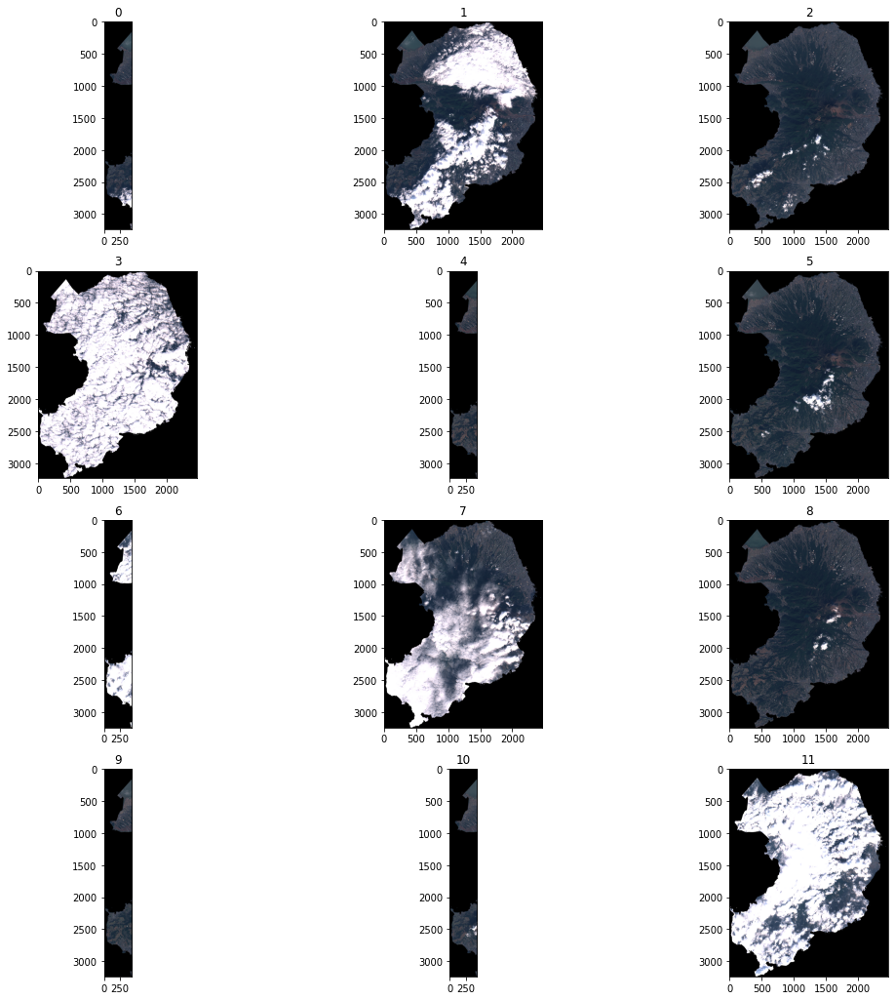

In [111]:
# 結果を描画
plt.figure(figsize=(18,18))

for i,f in enumerate(filenames):
    RGB_read = rio.open(RGB_dir+"/"+f)
    ax = plt.subplot(4, 3, i+1)
    ax.set_title(i)
    show(RGB_read.read([1,2,3]), ax=ax)

雲被覆が少ない画像を選択する

In [113]:
# 雲被覆が少ない画像
target_filenames = [filenames[2], filenames[5], filenames[8]]

In [114]:
target_filenames

['sentinel-2_S2A_MSIL1C_20211222T020111_N0301_R060_T52SFB_20211222T034633.tif',
 'sentinel-2_S2B_MSIL1C_20211207T020049_N0301_R060_T52SFB_20211207T033709.tif',
 'sentinel-2_S2A_MSIL1C_20220101T020101_N0301_R060_T52SFB_20220101T034550.tif']

In [117]:
target_titles = [s[11:-4] for s in target_filenames]

In [118]:
target_titles

['S2A_MSIL1C_20211222T020111_N0301_R060_T52SFB_20211222T034633',
 'S2B_MSIL1C_20211207T020049_N0301_R060_T52SFB_20211207T033709',
 'S2A_MSIL1C_20220101T020101_N0301_R060_T52SFB_20220101T034550']

# 正規化植生指数（NDVI）の算出

植生の活性度を見るためには、正規化植生指数（Normalized Difference Vegetation Index: NDVI）という指数を使う

近赤外線（NIR）と赤色（Red）の波長帯のデータを使って、以下の計算式で求める

`NDVI = (NIR - RED)/(NIR + RED)`

Sentinel-2の場合、バンド4で赤色、バンド8で近赤外線を使っている

In [119]:
NDVI_dir = './work/NDVI'

In [120]:
%%time
for file_title in target_titles:
    print("Start make NDVI " +'<'+ file_title +'>')

    path_A = str(file_title) + '.SAFE/GRANULE/'
    f1 = os.listdir(path_A)

    path_B = str(file_title) + '.SAFE/GRANULE/' + str(f1[0])
    f2 = os.listdir(path_B)

    path_C = str(file_title) + '.SAFE/GRANULE/' + str(f1[0]) + '/IMG_DATA/'
    f3 = os.listdir(path_C)
    
    # NDVIで利用するb4とb8を読み込み
    b4 = rio.open(str(file_title) + '.SAFE/GRANULE/' + str(f1[0]) +'/IMG_DATA/' +str(f3[0][0:23] +'B04.jp2'))
    b8 = rio.open(str(file_title) + '.SAFE/GRANULE/' + str(f1[0]) +'/IMG_DATA/' +str(f3[0][0:23] +'B08.jp2'))

    red = b4.read()
    nir = b8.read()
    
    # NDVI値の算出
    ndvi = np.where(((red != 0) & (nir != 0)),(nir.astype(float)-red.astype(float))/(nir.astype(float)+red.astype(float)), 0)

    out_meta = b4.meta
    out_meta.update(driver='GTiff')
    out_meta.update(dtype=rasterio.float32)

    NDVI_path = os.path.join(NDVI_dir,'sentinel-2_'+file_title+ '_ndvi.tif')

    with rio.open(NDVI_path, 'w', **out_meta) as dst:
        dst.write(ndvi.astype(rasterio.float32))

    print("---masking---")
    with rio.open(NDVI_path) as src2:
        out_image_ndvi, out_transform = rasterio.mask.mask(src2, masks, crop=True)
        out_meta = src2.meta

    out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

    with rasterio.open(NDVI_path, "w", **out_meta) as dst2:
        dst2.write(out_image_ndvi)

    print("Done")

Start make NDVI <S2A_MSIL1C_20211222T020111_N0301_R060_T52SFB_20211222T034633>
---masking---
Done
Start make NDVI <S2B_MSIL1C_20211207T020049_N0301_R060_T52SFB_20211207T033709>
---masking---
Done
Start make NDVI <S2A_MSIL1C_20220101T020101_N0301_R060_T52SFB_20220101T034550>
---masking---
Done
CPU times: user 3min 31s, sys: 6.7 s, total: 3min 37s
Wall time: 1min 3s


In [124]:
ndvi_out_files = np.sort([s for s in os.listdir(NDVI_dir) if 'sentinel-2_S' in s])

In [125]:
ndvi_out_files

array(['sentinel-2_S2A_MSIL1C_20211222T020111_N0301_R060_T52SFB_20211222T034633_ndvi.tif',
       'sentinel-2_S2A_MSIL1C_20220101T020101_N0301_R060_T52SFB_20220101T034550_ndvi.tif',
       'sentinel-2_S2B_MSIL1C_20211207T020049_N0301_R060_T52SFB_20211207T033709_ndvi.tif'],
      dtype='<U80')

In [126]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

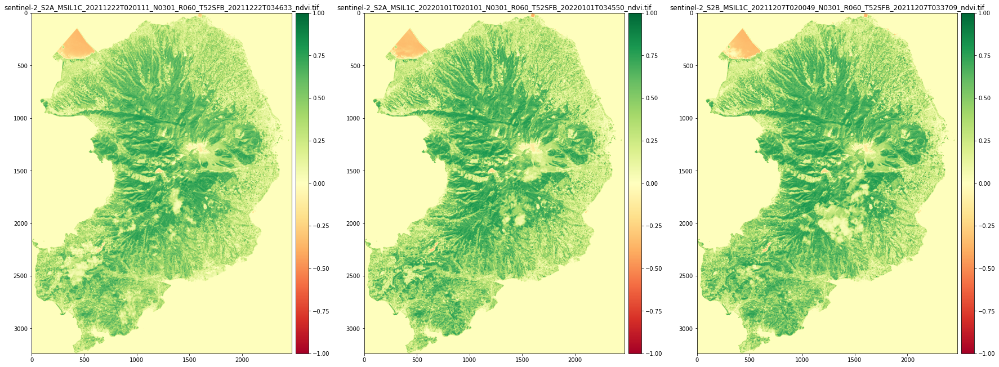

In [141]:
# 結果を描画
fig = plt.figure(figsize=(30,25))

for i,f in enumerate(ndvi_out_files):
    NDVI_read = rio.open(NDVI_dir+"/"+f)
    NDVI_read = NDVI_read.read(1)
    
    ax = plt.subplot(1, 3, i+1)
    ndvi=ax.imshow(NDVI_read, cmap='RdYlGn')
    ax.set_title(f)
    ndvi.set_clim(vmin=-1, vmax=1) # 画像同士の違いを比較しやすくするために、NDVIの範囲を-1から1に揃える
    divider = make_axes_locatable(ax)
    ax_cb = divider.new_horizontal(size="5%", pad=0.1)
    fig.add_axes(ax_cb)
    plt.colorbar(ndvi, cax=ax_cb)
    del(ax)

NDVIの値が1に近い（緑色が強い）ほど植物の活性が高いことを示しており、-1に近い（赤が強い）ほど植生が少ないことを示している

## 対象地域の差分抽出

2021/12/07 のデータと 2022/01/01 のデータを比較する

In [152]:
#範囲の指定
minX = 0
minY = 2000
deltaX = 1000
deltaY = 1000

In [153]:
#NDVI差分の作成
NDVI_2021 = rio.open(NDVI_dir+'/sentinel-2_S2B_MSIL1C_20211207T020049_N0301_R060_T52SFB_20211207T033709_ndvi.tif')
NDVI_2022 = rio.open(NDVI_dir+'/sentinel-2_S2A_MSIL1C_20220101T020101_N0301_R060_T52SFB_20220101T034550_ndvi.tif')

NDVI_2021_read = NDVI_2021.read()
NDVI_2022_read = NDVI_2022.read()

ndvi_diff = np.where(((NDVI_2021_read != 0) & (NDVI_2022_read != 0)),(NDVI_2022_read.astype(float)-NDVI_2021_read.astype(float)), 0)

out_meta = NDVI_2021.meta
out_meta.update(driver='GTiff')
out_meta.update(dtype=rasterio.float32)

NDVI_diff_path = os.path.join(NDVI_dir,'sentinel-2_ndvi_diff.tif')

with rio.open(NDVI_diff_path, 'w', **out_meta) as dst:
    dst.write(ndvi_diff.astype(rasterio.float32))

path_ndvi_diff = "./work/NDVI/sentinel-2_ndvi_diff.tif"

#NDVI差分画像の切り出し
print("Start cliping images " +'<'+ str(path_ndvi_diff) +'>')
maskdata_path = os.path.join(NDVI_dir + "/" + "ndvi_diff_clip.tif")
ds=gdal.Translate(maskdata_path, path_ndvi_diff, srcWin=[minX,minY,deltaX,deltaY])

#RGB画像の指定
path_2021 = "./work/RGB_TIF/sentinel-2_S2B_MSIL1C_20211207T020049_N0301_R060_T52SFB_20211207T033709.tif" 
path_2022 = "./work/RGB_TIF/sentinel-2_S2A_MSIL1C_20220101T020101_N0301_R060_T52SFB_20220101T034550.tif" 

ln = [path_2021,path_2022]

#切り出し
for n in ln:
    print("Start cliping images " +'<'+ n +'>')
    maskdata_path = os.path.join(RGB_dir + "/" + "clip_" + str(n[37:45]) + ".tif")
    ds=gdal.Translate(maskdata_path, n, srcWin=[minX,minY,deltaX,deltaY])
    ds=None

Start cliping images <./work/NDVI/sentinel-2_ndvi_diff.tif>
Start cliping images <./work/RGB_TIF/sentinel-2_S2B_MSIL1C_20211207T020049_N0301_R060_T52SFB_20211207T033709.tif>
Start cliping images <./work/RGB_TIF/sentinel-2_S2A_MSIL1C_20220101T020101_N0301_R060_T52SFB_20220101T034550.tif>


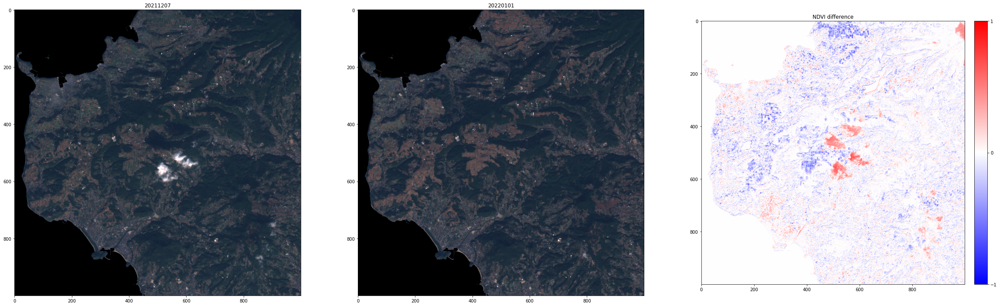

In [154]:
# 切り取った画像の表示
fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(40,30))

#画像の読み込み
cut_img2021=rio.open("./work/RGB_TIF/clip_20211207.tif")
cut_img2022=rio.open("./work/RGB_TIF/clip_20220101.tif")
cut_imgNDVI=rio.open("./work/NDVI/ndvi_diff_clip.tif")

ax1 = plt.subplot(1,3,1)
ax1.set_title("20211207")
ax2 = plt.subplot(1,3,2)
ax2.set_title("20220101")
ax3 = plt.subplot(1,3,3)
ax3.set_title("NDVI difference")

show(cut_img2021.read([1,2,3]),ax=ax1)
show(cut_img2022.read([1,2,3]),ax=ax2)
img_n = ax3.imshow(cut_imgNDVI.read(1), cmap=plt.cm.bwr)
img_n.set_clim(vmin=-1, vmax=1)
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right",size="5%", pad=0.3)
cbar = plt.colorbar(img_n, cax=cax,ticks=[-1, 0, 1])

中心付近の赤くなっている部分は雲による変化なだけっぽい（上側は雲の影、下側が雲自体）

青は植生が減っている箇所、赤は植生が増えている箇所。

NDVIはB4とB8を使っているため解像度は10mになる

https://www.restec.or.jp/satellite/sentinel-2-a-2-b.html

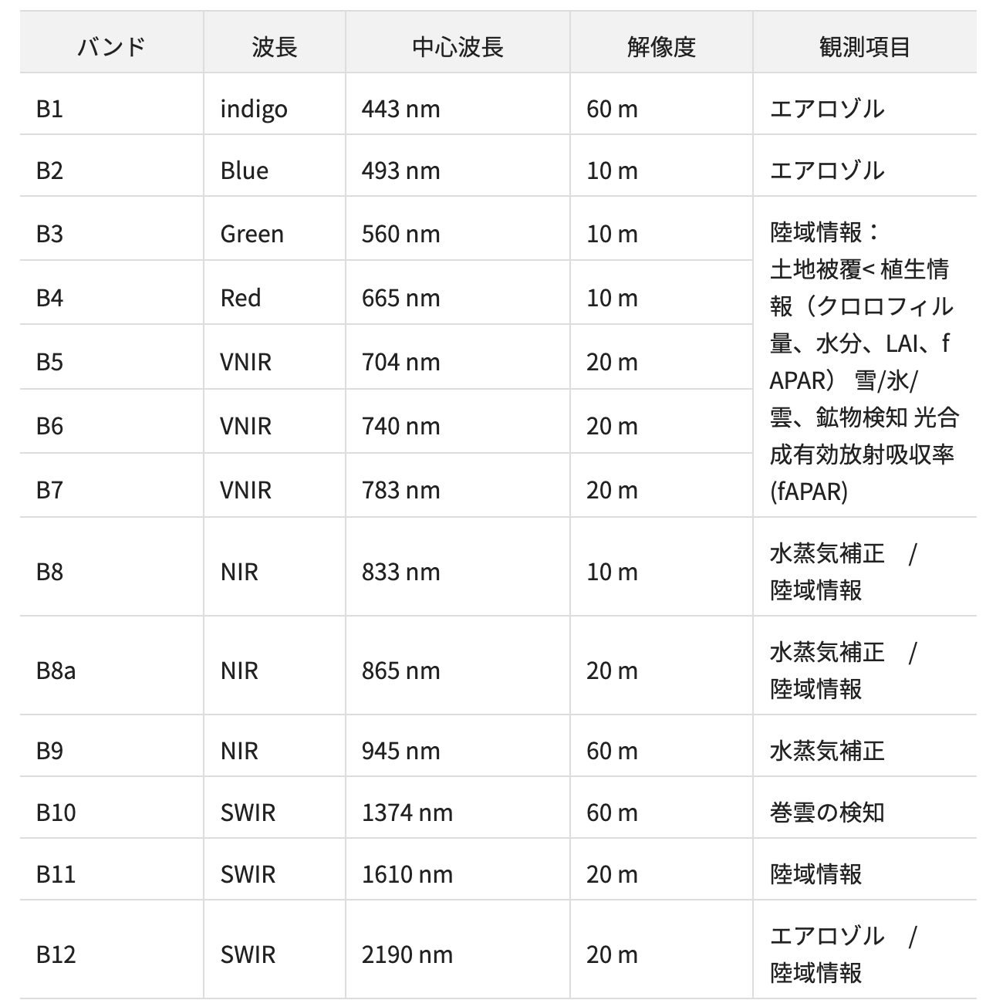

Planetで4m、MAXARのWorldViewなど高解像度のものは1m~2mのデータが存在する

- WorldView4のサンプル: https://www.sed.co.jp/sug/contents/sample/wordview4_SydneyBeaches_WM.html

- Airbus Pleiadesのサンプル： https://www.sed.co.jp/sug/contents/sample/pleiades_shinjuku.html

### TIFをJPEG変換



In [155]:
from osgeo import gdal

scale = '-scale 0 100 0 150'
options_list = [
    '-ot Byte',
    '-of JPEG',
    scale
] 
options_string = " ".join(options_list)

gdal.Translate('./work/RGB_TIF/clip_20211207.jpg',
               './work/RGB_TIF/clip_20211207.tif',
               options=options_string)

gdal.Translate('./work/RGB_TIF/clip_20220101.jpg',
               './work/RGB_TIF/clip_20220101.tif',
               options=options_string)

<osgeo.gdal.Dataset; proxy of <Swig Object of type 'GDALDatasetShadow *' at 0x7fd2128ff4b0> >

In [156]:
plt.close()

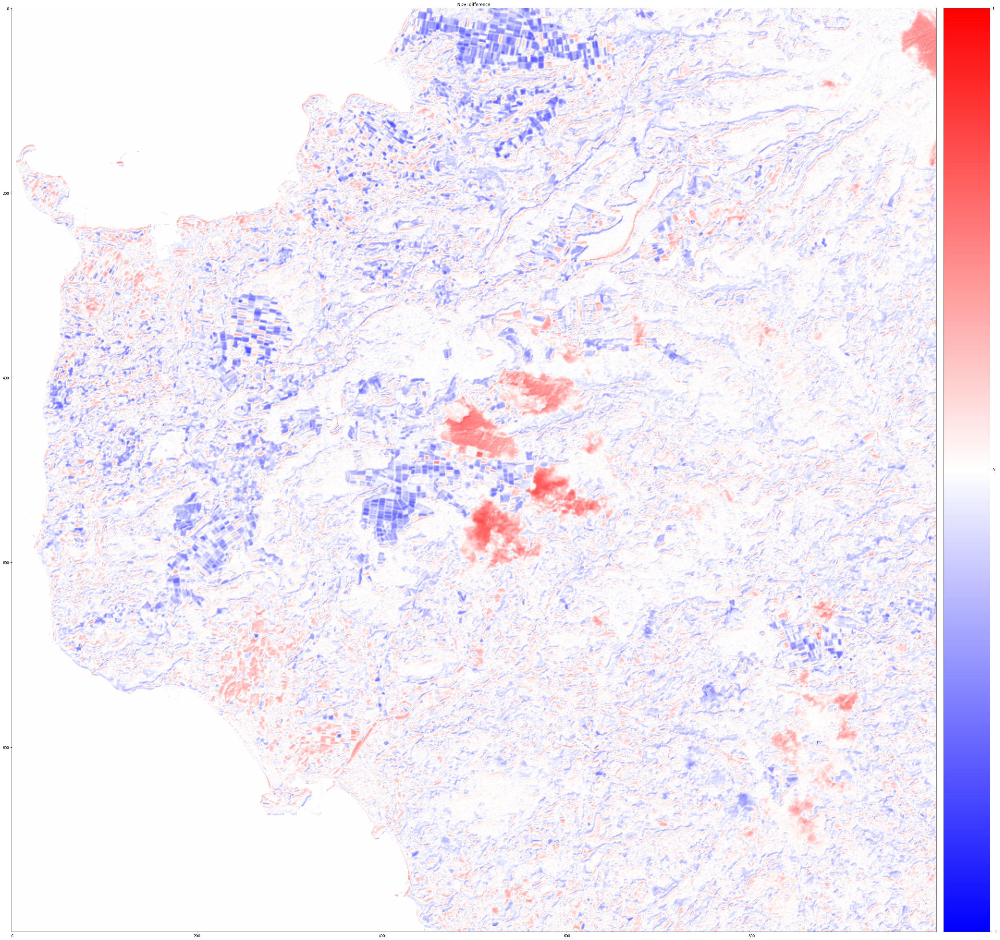

In [157]:
# 切り取った画像の表示
fig, ax1 = plt.subplots(1,1,figsize=(50,50))
cut_imgNDVI=rio.open("./work/NDVI/ndvi_diff_clip.tif")
ax1.set_title("NDVI difference")

img_n = ax1.imshow(cut_imgNDVI.read(1), cmap=plt.cm.bwr)
img_n.set_clim(vmin=-1, vmax=1)
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right",size="5%", pad=0.3)
cbar = plt.colorbar(img_n, cax=cax,ticks=[-1, 0, 1])

#fig.subplots_adjust(left=0, right=0.1, bottom=0, top=0.1)
plt.savefig('./work/NDVI/ndvi_diff_clip.jpg')

# 正規化水指標（NDWI）の算出

NDWIは２種類あり、地表面の水域を見る場合と、植生に含まれる水分量を見る場合で、計算式が異なる。

- 地表面の水域

`NDWI = (RED - SWIR) / (RED + SWIR)`

- 植生の水分量

`NDWI = (NIR - SWIR) / (NIR + SWIR)`

Sentinel-2の場合、バンド11でSWIR(短波長赤外線)を使っている

In [130]:
NDWI_dir = './work/NDWI'

In [133]:
from rasterio.enums import Resampling

In [65]:


upscale_factor = 1/2

with rio.open(str(file_title) + '.SAFE/GRANULE/' + str(f1[0]) +'/IMG_DATA/' +str(f3[0][0:23] +'B04.jp2')) as dataset:

    # resample data to target shape
    data = dataset.read(
        out_shape=(
            dataset.count,
            int(dataset.height * upscale_factor),
            int(dataset.width * upscale_factor)
        ),
        resampling=Resampling.bilinear
    )

    # scale image transform
    transform = dataset.transform * dataset.transform.scale(
        (dataset.width / data.shape[-1]),
        (dataset.height / data.shape[-2])
    )

In [67]:
data.shape

(1, 5490, 5490)

In [69]:
transform

Affine(20.0, 0.0, 600000.0,
       0.0, -20.0, 3700020.0)

In [136]:
%%time
for file_title in target_titles:
    print("Start make NDWI " +'<'+ file_title +'>')

    path_A = str(file_title) + '.SAFE/GRANULE/'
    f1 = os.listdir(path_A)

    path_B = str(file_title) + '.SAFE/GRANULE/' + str(f1[0])
    f2 = os.listdir(path_B)

    path_C = str(file_title) + '.SAFE/GRANULE/' + str(f1[0]) + '/IMG_DATA/'
    f3 = os.listdir(path_C)

    b4 = rio.open(str(file_title) + '.SAFE/GRANULE/' + str(f1[0]) +'/IMG_DATA/' +str(f3[0][0:23] +'B04.jp2'))
    b11 = rio.open(str(file_title) + '.SAFE/GRANULE/' + str(f1[0]) +'/IMG_DATA/' +str(f3[0][0:23] +'B11.jp2'))
    
    # b11の方が低解像度なので、b4を低解像度に合わせる
    upscale_factor = 1/2
    red = b4.read(
        out_shape=(
            b4.count,
            int(b4.height * upscale_factor),
            int(b4.width * upscale_factor)
        ),
        resampling=Resampling.bilinear
    )

    swir = b11.read()

    ndwi = np.where(((red != 0) & (swir != 0)),(red.astype(float)-swir.astype(float))/(red.astype(float)+swir.astype(float)), 0)
    
    out_meta = b4.meta
    out_meta.update(driver='GTiff')
    out_meta.update(dtype=rasterio.float32)

    NDWI_path = os.path.join(NDWI_dir,'sentinel-2_'+file_title+ '_ndwi.tif')

    with rio.open(NDWI_path, 'w', **out_meta) as dst:
        dst.write(ndwi.astype(rasterio.float32))

    print("---masking---")
    with rio.open(NDWI_path) as src2:
        out_image_ndwi, out_transform = rasterio.mask.mask(src2, masks, crop=True)
        out_meta = src2.meta

    out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

    with rasterio.open(NDWI_path, "w", **out_meta) as dst2:
        dst2.write(out_image_ndwi)

    print("Done")

Start make NDWI <S2A_MSIL1C_20211222T020111_N0301_R060_T52SFB_20211222T034633>
---masking---
Done
Start make NDWI <S2B_MSIL1C_20211207T020049_N0301_R060_T52SFB_20211207T033709>
---masking---
Done
Start make NDWI <S2A_MSIL1C_20220101T020101_N0301_R060_T52SFB_20220101T034550>
---masking---
Done
CPU times: user 1min 4s, sys: 2.96 s, total: 1min 7s
Wall time: 23.3 s


In [137]:
ndwi_out_files = np.sort([s for s in os.listdir(NDWI_dir) if 'sentinel-2_S' in s])

In [138]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

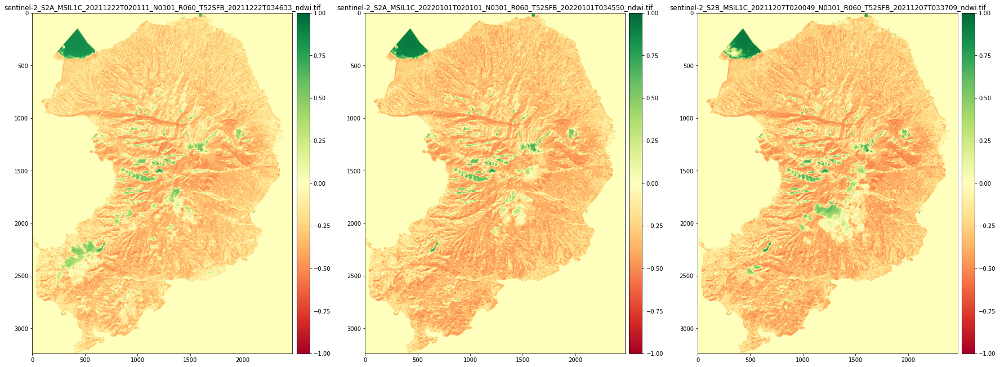

In [140]:
# 結果を描画
fig = plt.figure(figsize=(30,25))

for i,f in enumerate(ndwi_out_files):
    NDWI_read = rio.open(NDWI_dir+"/"+f)
    NDWI_read = NDWI_read.read(1)
    
    ax = plt.subplot(1, 3, i+1)
    ndwi=ax.imshow(NDWI_read, cmap='RdYlGn')
    ax.set_title(f)
    ndwi.set_clim(vmin=-1, vmax=1) # 画像同士の違いを比較しやすくするために、NDWIの範囲を-1から1に揃える
    divider = make_axes_locatable(ax)
    ax_cb = divider.new_horizontal(size="5%", pad=0.1)
    fig.add_axes(ax_cb)
    plt.colorbar(ndvi, cax=ax_cb)
    del(ax)

## 対象地域の差分抽出

2021/12/07 のデータと 2022/01/01 のデータを比較する

In [142]:
#範囲の指定
minX = 0
deltaX = 1000
minY = 2000
deltaY = 1000

In [145]:
# 差分の作成
ndwi_2021 = rio.open(NDWI_dir+'/sentinel-2_S2B_MSIL1C_20211207T020049_N0301_R060_T52SFB_20211207T033709_ndwi.tif')
ndwi_2022 = rio.open(NDWI_dir+'/sentinel-2_S2A_MSIL1C_20220101T020101_N0301_R060_T52SFB_20220101T034550_ndwi.tif')

ndwi_2021_read = ndwi_2021.read()
ndwi_2022_read = ndwi_2022.read()

ndwi_diff = np.where(((ndwi_2021_read != 0) & (ndwi_2022_read != 0)),(ndwi_2022_read.astype(float)-ndwi_2021_read.astype(float)), 0)

out_meta = ndwi_2021.meta
out_meta.update(driver='GTiff')
out_meta.update(dtype=rasterio.float32)

ndwi_diff_path = os.path.join(NDWI_dir,'sentinel-2_NDWI_diff.tif')

with rio.open(ndwi_diff_path, 'w', **out_meta) as dst:
    dst.write(ndwi_diff.astype(rasterio.float32))

path_ndwi_diff = "./work/NDWI/sentinel-2_NDWI_diff.tif"

#ndwi差分画像の切り出し
print("Start cliping images " +'<'+ str(path_ndwi_diff) +'>')
maskdata_path = os.path.join(NDWI_dir + "/" + "NDWI_diff_clip.tif")
ds=gdal.Translate(maskdata_path, path_ndwi_diff, srcWin=[minX,minY,deltaX,deltaY])

#RGB画像の指定
path_2021 = "./work/RGB_TIF/sentinel-2_S2B_MSIL1C_20211207T020049_N0301_R060_T52SFB_20211207T033709.tif" 
path_2022 = "./work/RGB_TIF/sentinel-2_S2A_MSIL1C_20220101T020101_N0301_R060_T52SFB_20220101T034550.tif" 

ln = [path_2021,path_2022]

#切り出し
for n in ln:
    print("Start cliping images " +'<'+ n +'>')
    maskdata_path = os.path.join(RGB_dir + "/" + "clip_" + str(n[37:45]) + ".tif")
    ds=gdal.Translate(maskdata_path, n, srcWin=[minX,minY,deltaX,deltaY])
    ds=None

Start cliping images <./work/NDWI/sentinel-2_NDWI_diff.tif>
Start cliping images <./work/RGB_TIF/sentinel-2_S2B_MSIL1C_20211207T020049_N0301_R060_T52SFB_20211207T033709.tif>
Start cliping images <./work/RGB_TIF/sentinel-2_S2A_MSIL1C_20220101T020101_N0301_R060_T52SFB_20220101T034550.tif>


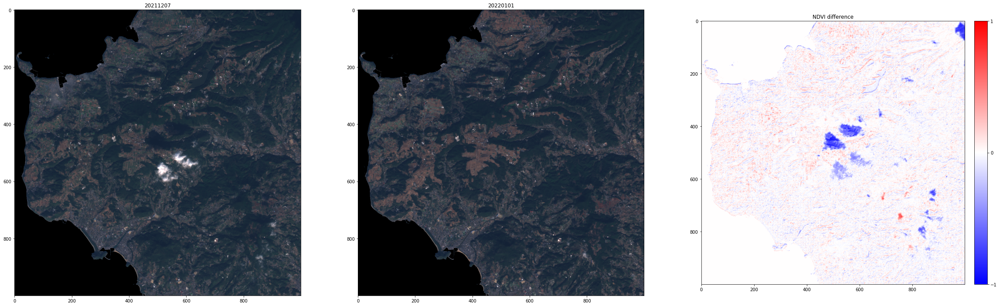

In [147]:
# 切り取った画像の表示
fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(40,30))

#画像の読み込み
cut_img2021=rio.open("./work/RGB_TIF/clip_20211207.tif")
cut_img2022=rio.open("./work/RGB_TIF/clip_20220101.tif")
cut_imgNDWI=rio.open("./work/NDWI/NDWI_diff_clip.tif")

ax1 = plt.subplot(1,3,1)
ax1.set_title("20211207")
ax2 = plt.subplot(1,3,2)
ax2.set_title("20220101")
ax3 = plt.subplot(1,3,3)
ax3.set_title("NDVI difference")

show(cut_img2021.read([1,2,3]),ax=ax1)
show(cut_img2022.read([1,2,3]),ax=ax2)
img_n = ax3.imshow(cut_imgNDWI.read(1), cmap=plt.cm.bwr)
img_n.set_clim(vmin=-1, vmax=1)
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right",size="5%", pad=0.3)
cbar = plt.colorbar(img_n, cax=cax,ticks=[-1, 0, 1])

中心付近の赤くなっている部分は雲による変化なだけっぽい（上側は雲の影、下側が雲自体）

青は水分が減っている箇所、赤は水分が増えている箇所。

b11が解像度20mのため、NDWIの結果も解像度は20m

## TIF→JPEG変換



In [148]:
from osgeo import gdal

scale = '-scale 0 100 0 150'
options_list = [
    '-ot Byte',
    '-of JPEG',
    scale
] 
options_string = " ".join(options_list)

gdal.Translate('./work/RGB_TIF/clip_20211207.jpg',
               './work/RGB_TIF/clip_20211207.tif',
               options=options_string)

gdal.Translate('./work/RGB_TIF/clip_20220101.jpg',
               './work/RGB_TIF/clip_20220101.tif',
               options=options_string)

<osgeo.gdal.Dataset; proxy of <Swig Object of type 'GDALDatasetShadow *' at 0x7fd213f8a900> >

In [149]:
plt.close()

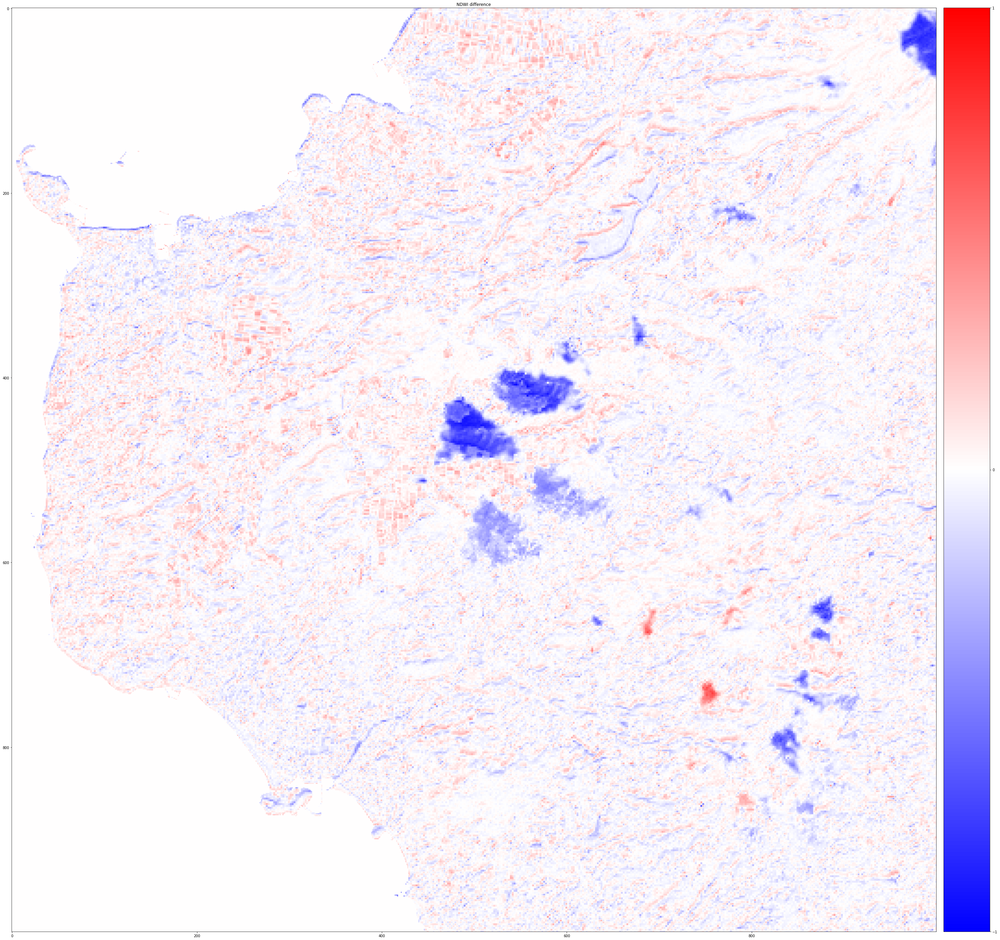

In [151]:
# 切り取った画像の表示
fig, ax1 = plt.subplots(1,1,figsize=(50,50))
cut_imgNDWI=rio.open("./work/NDWI/NDWI_diff_clip.tif")
ax1.set_title("NDWI difference")

img_n = ax1.imshow(cut_imgNDWI.read(1), cmap=plt.cm.bwr)
img_n.set_clim(vmin=-1, vmax=1)
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right",size="5%", pad=0.3)
cbar = plt.colorbar(img_n, cax=cax,ticks=[-1, 0, 1])

#fig.subplots_adjust(left=0, right=0.1, bottom=0, top=0.1)
plt.savefig('./work/NDWI/ndwi_diff_clip.jpg')